In [15]:
%load_ext autoreload
%autoreload 2
from LogGabor import LogGabor
parameterfile = 'https://raw.githubusercontent.com/bicv/LogGabor/master/default_param.py'
lg = LogGabor(parameterfile)
import holoviews as hv
#hv.notebook_extension('bokeh')
%load_ext holoviews.ipython
%output size=150 dpi=120
%load_ext autoreload
%autoreload 2
import os
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
fig_width = 12
figsize=(fig_width, .618*fig_width)


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
The holoviews.ipython extension is already loaded. To reload it, use:
  %reload_ext holoviews.ipython
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [18]:
import numpy as np
np.set_printoptions(precision=2, suppress=True)

In [19]:
from LogGabor import imread
image = imread('https://github.com/bicv/SLIP/raw/master/database/yelmo512.png')
print('Mean intensity: ', image.mean(), ' - standard deviation: ', image.std())

Mean intensity:  0.5346490691900253  - standard deviation:  0.22045908846780704


In [20]:
lg = LogGabor(parameterfile)
lg.set_size(image)

In [21]:
image = lg.normalize(image, center=True)
print('Mean intensity: ', image.mean(), ' - standard deviation: ', image.std())

Mean intensity:  -0.042770279037368776  - standard deviation:  0.394707489264721


In [23]:
#TESTING ON SAMPLE IMAGE
lg = LogGabor(parameterfile)
image = imread('https://github.com/bicv/SLIP/raw/master/database/yelmo512.png')
lg.set_size(image)
lg.pe.datapath = 'database/'
print(lg.pe)

{'N_image': 100, 'seed': None, 'N_X': 512, 'N_Y': 512, 'noise': 0.1, 'do_mask': True, 'mask_exponent': 3.0, 'do_whitening': True, 'white_name_database': 'kodakdb', 'white_n_learning': 0, 'white_N': 0.07, 'white_N_0': 0.0, 'white_f_0': 0.4, 'white_alpha': 1.4, 'white_steepness': 4.0, 'white_recompute': False, 'base_levels': 1.618, 'n_theta': 24, 'B_sf': 0.4, 'B_theta': 0.17453277777777776, 'use_cache': True, 'figpath': 'results', 'edgefigpath': 'results/edges', 'matpath': 'cache_dir', 'edgematpath': 'cache_dir/edges', 'datapath': 'database/', 'ext': '.pdf', 'figsize': 14.0, 'formats': ['pdf', 'png', 'jpg'], 'dpi': 450, 'verbose': 0}


:Image   [x,y]   (z)
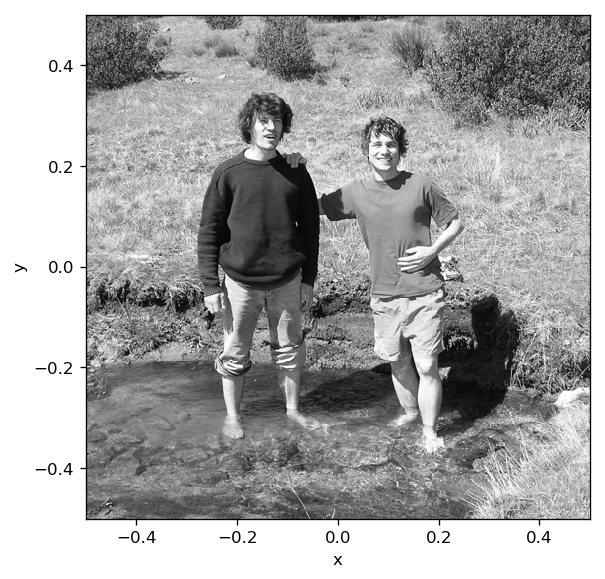

In [25]:
%%opts Image (cmap='gray') 
hv.Image(image)

:Image   [x,y]   (z)
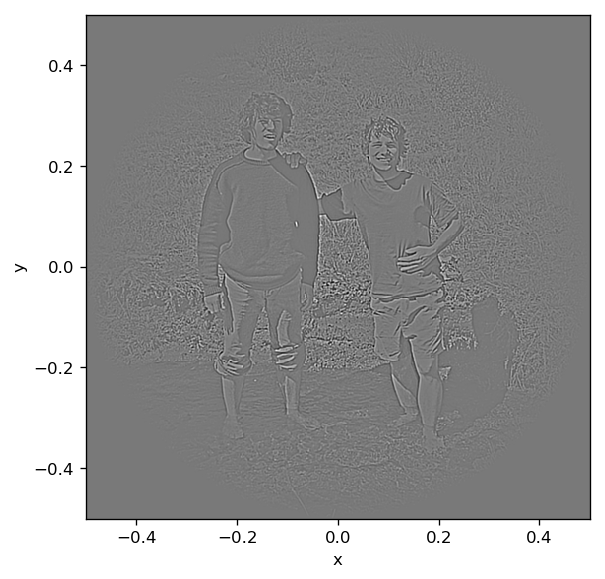

In [26]:
%%opts Image (cmap='gray') 
image = lg.whitening(image)*lg.mask
hv.Image(image)

In [28]:
%opts Image.Phase_domain (cmap='hsv')
%opts Image.Amplitude_domain (cmap='hot')

In [32]:
# a function to explore these parameters:
sf_0 = .02 # TODO .1 cycle / pixel (Geisler)
params= {'sf_0':sf_0, 'B_sf': lg.pe.B_sf, 'theta':0., 'B_theta': lg.pe.B_theta}
def filter_explore(image, param_name, param_range, verb=False, angle=False, movie=True):
    if movie:
        amp_map, phase_map = hv.HoloMap(), hv.HoloMap()
    else:
        ims = []
    for param_ in param_range:
        if angle:
            title = np.str(param_*180/np.pi) + r'$^0$'
        else:
            title = np.str(param_)
        if param_name=='phase':
            FT_phase = np.exp(-1j*param_)
            params_=params.copy()
        else:
            FT_phase = 1
            params_=params.copy()
            params_.update({param_name:param_})
        FT_lg = lg.loggabor(0, 0, **params_)
        im_ = lg.FTfilter(image, FT_lg, full=True)
        
        amp = hv.Image(lg.normalize(np.absolute(im_), center=False), 
                    group='Amplitude domain',
                    key_dimensions=[r'$f_x$', r'$f_y$'],
                    value_dimensions=[hv.Dimension('Amplitude', range=(0,1))])
        phase = hv.Image(np.angle(im_)/np.pi,
                    group='Phase domain',
                    key_dimensions=[r'$x$', r'$y$'],
                    value_dimensions=[hv.Dimension('Phase', range=(-1,1))])
        if movie:
            amp_map[param_] = amp
            phase_map[param_] = phase
        else:
            ims.append((amp+phase))
    if movie:
        return amp_map + phase_map
    else:
        return np.sum(sv).cols(2)

:Layout
   .Amplitude_domain.I :HoloMap   [Default]
      :Image   [x,y]   (z)
   .Phase_domain.I     :HoloMap   [Default]
      :Image   [x,y]   (z)
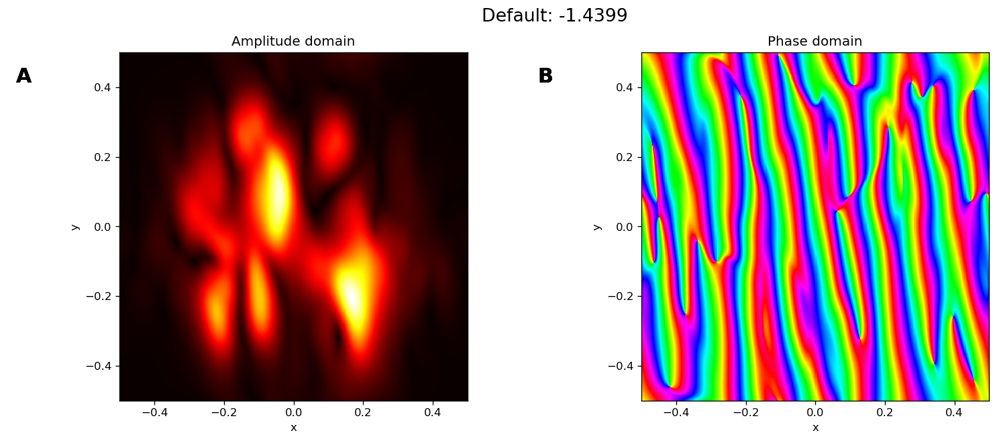
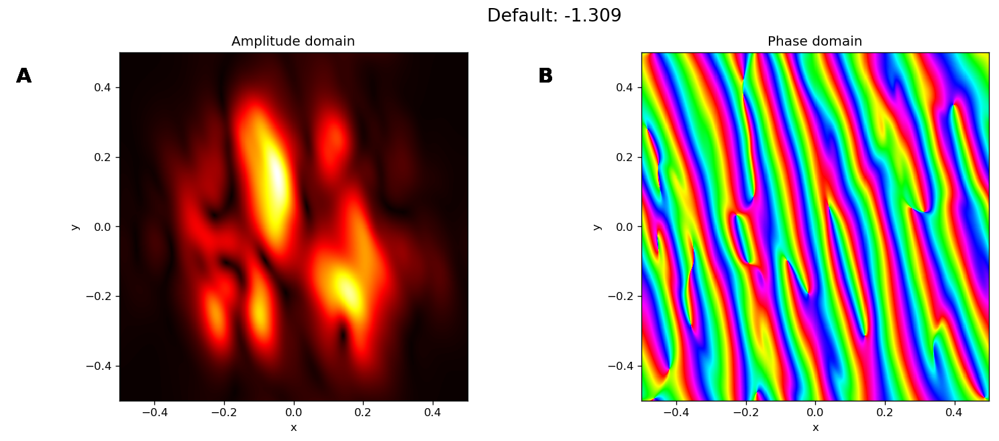
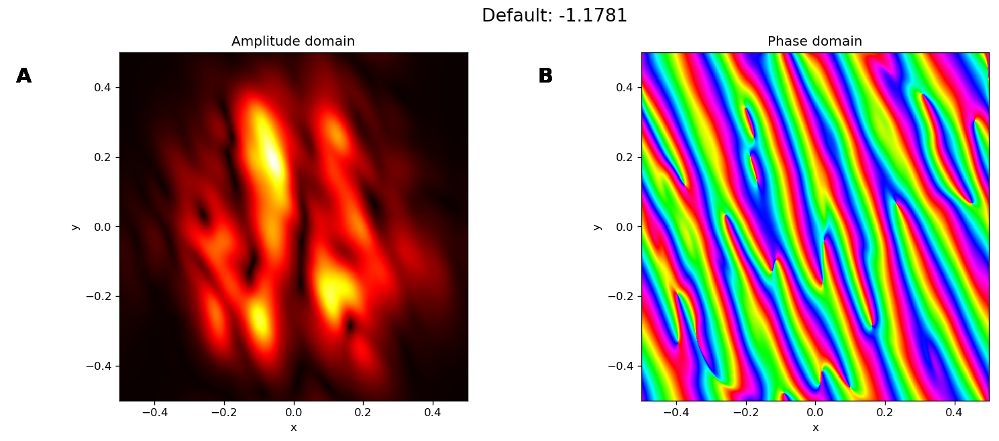
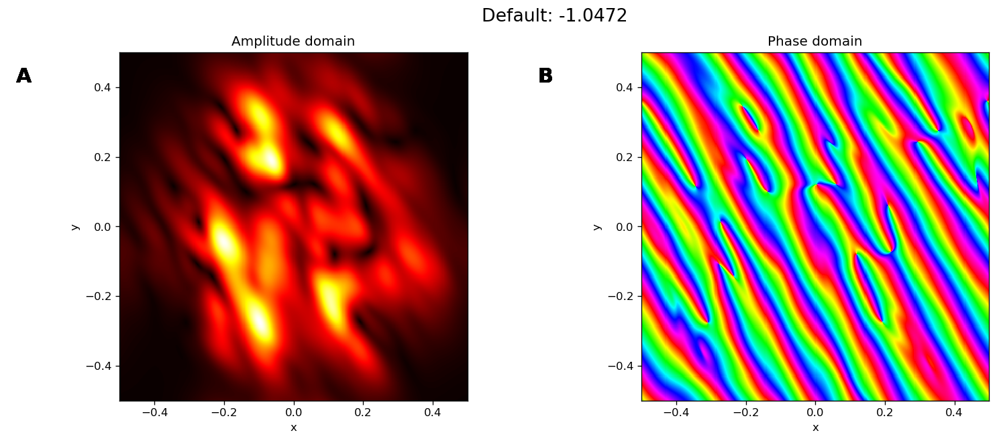
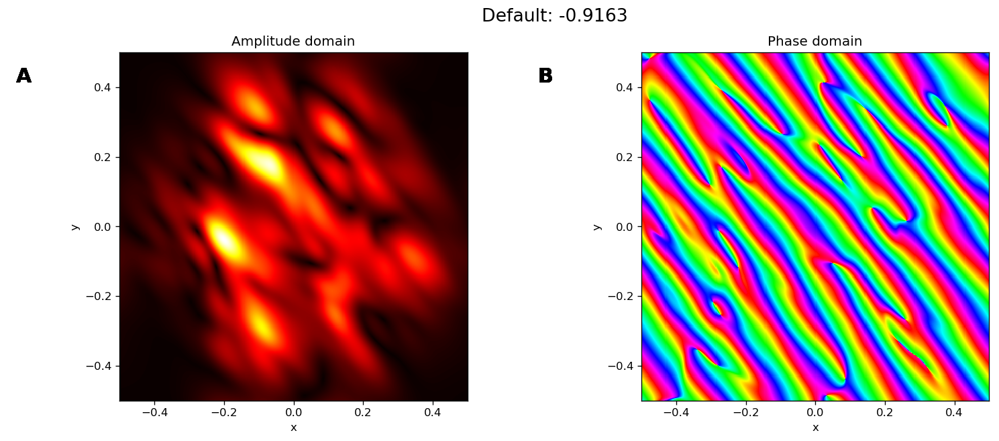
...
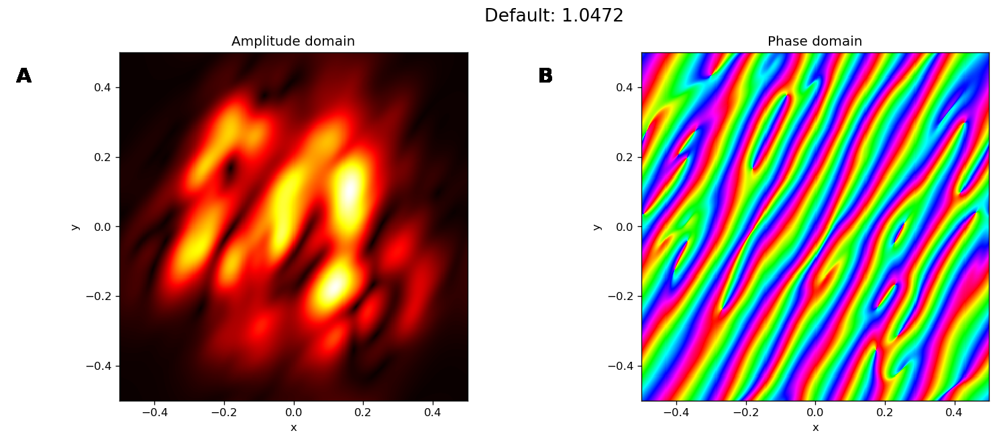
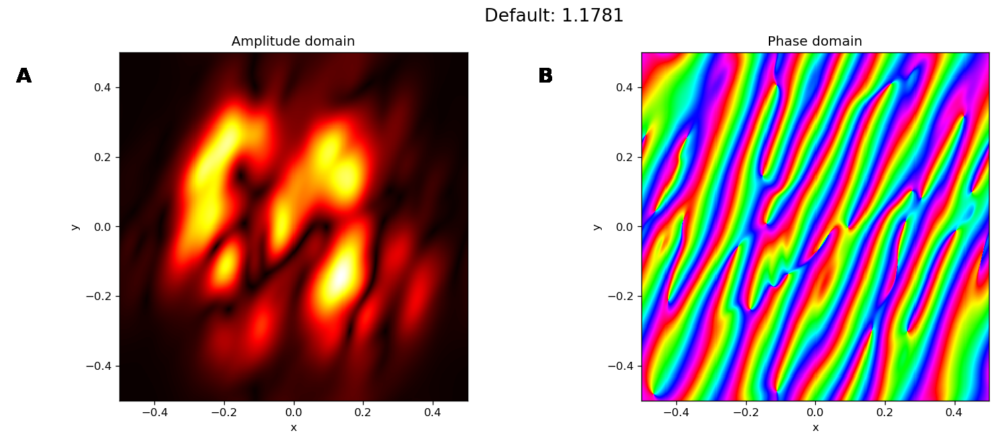
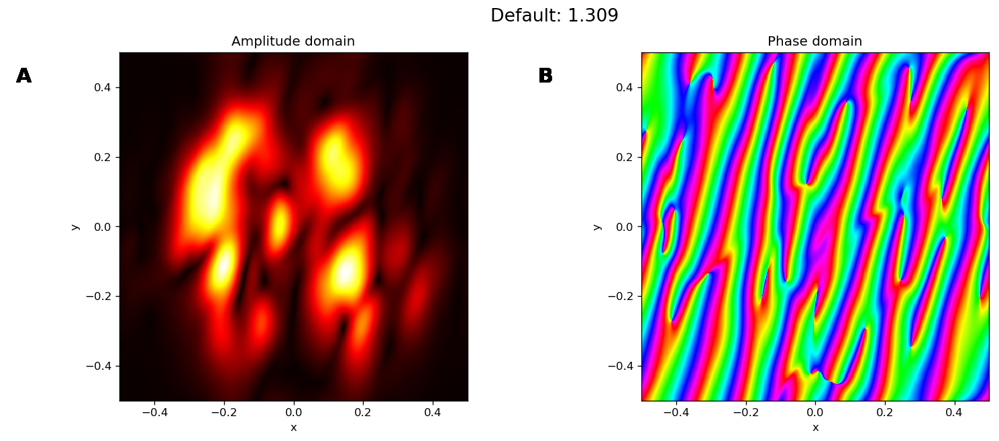
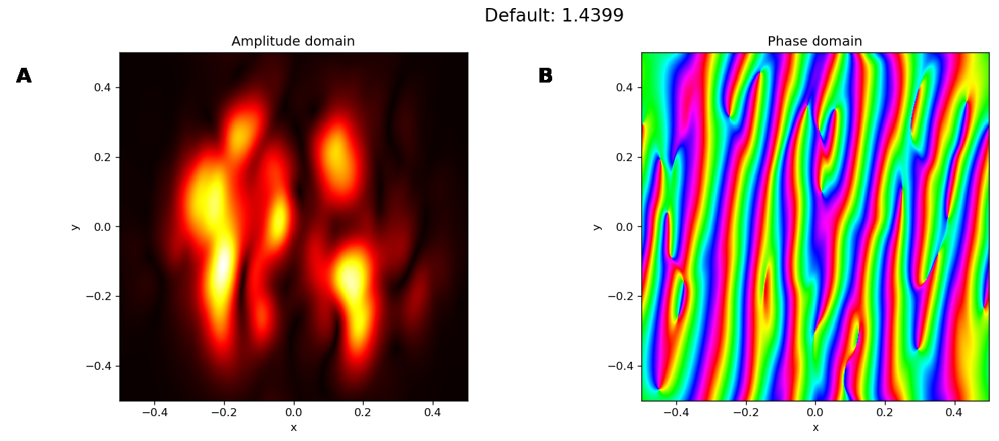
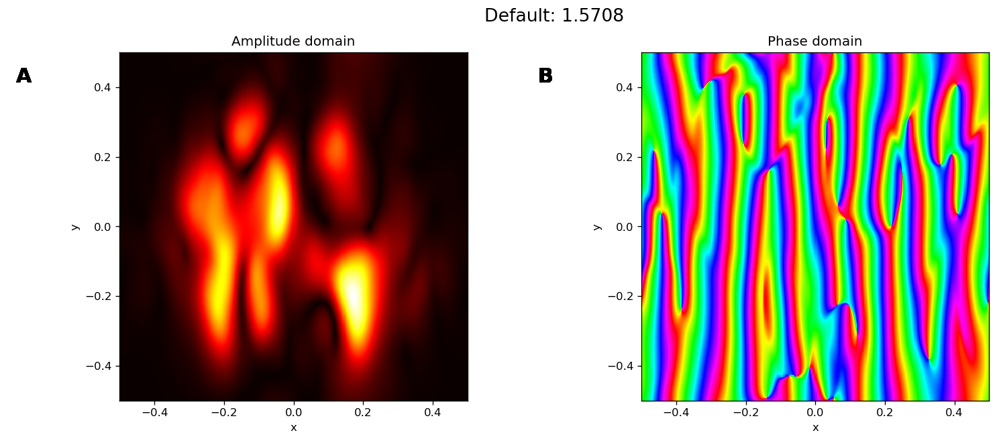

In [31]:
# explore parameters of LogGabors on the filtering:
filter_explore(image, param_name='theta', param_range=lg.theta)

:Layout
   .Amplitude_domain.I :HoloMap   [Default]
      :Image   [x,y]   (z)
   .Phase_domain.I     :HoloMap   [Default]
      :Image   [x,y]   (z)
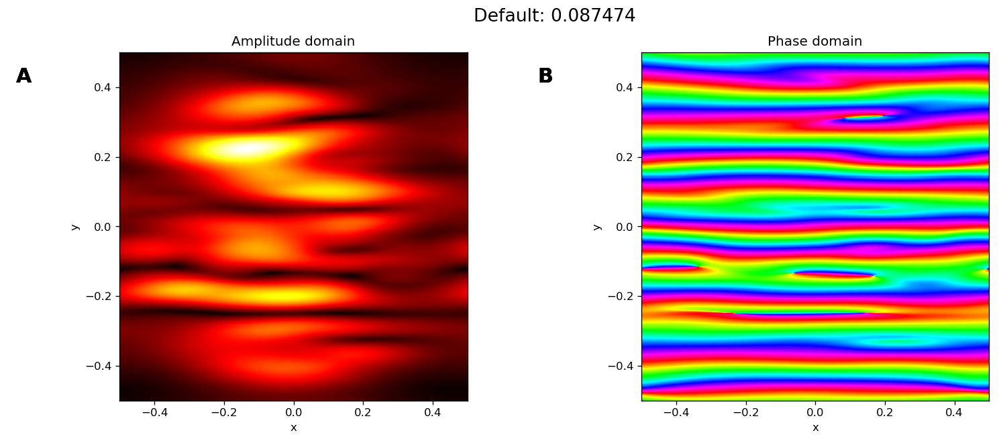
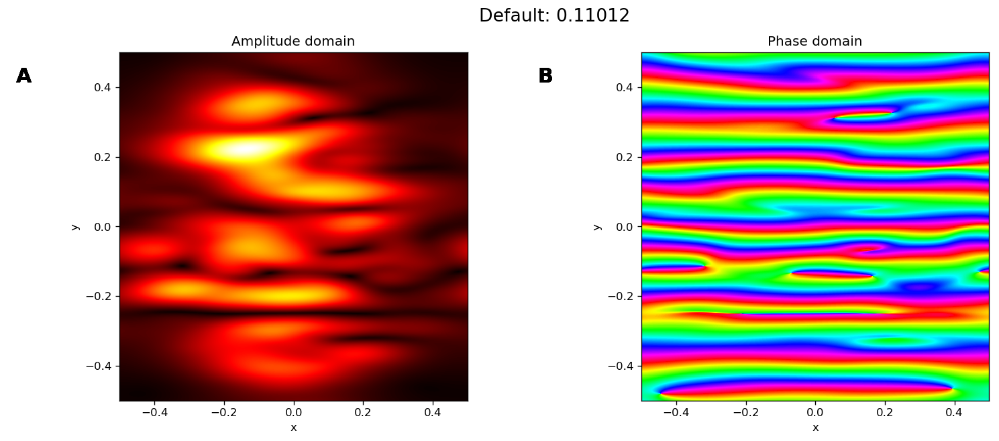
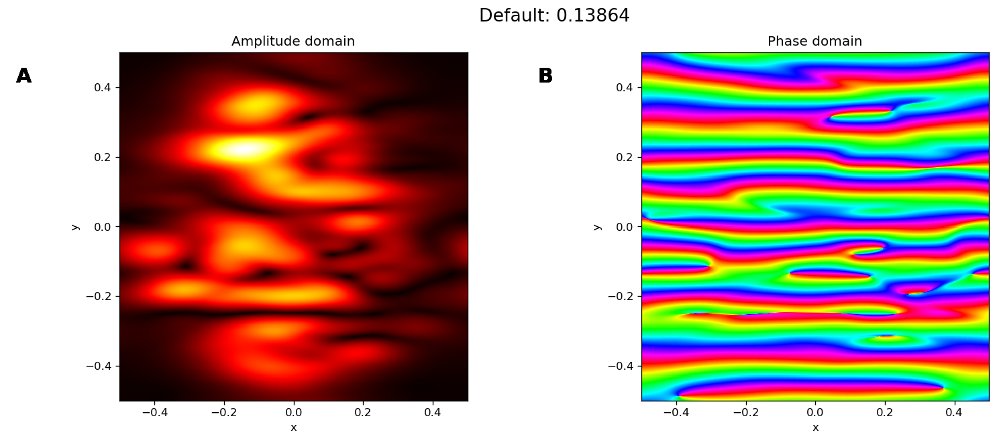
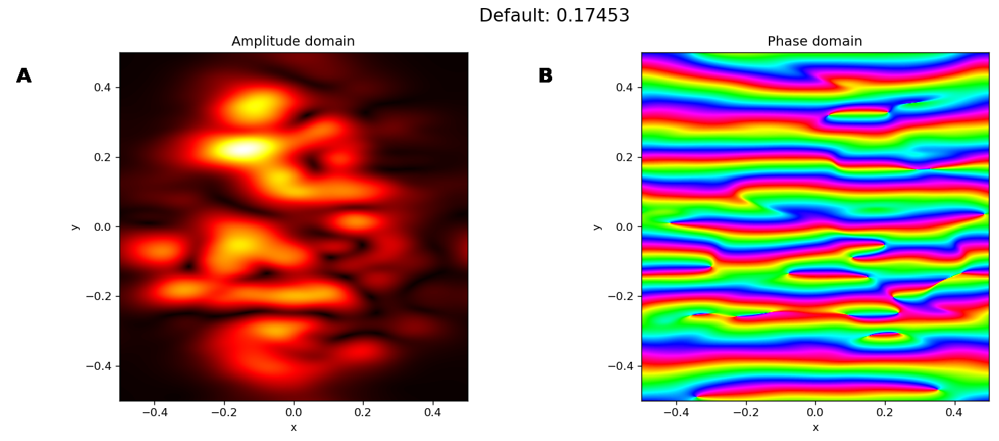
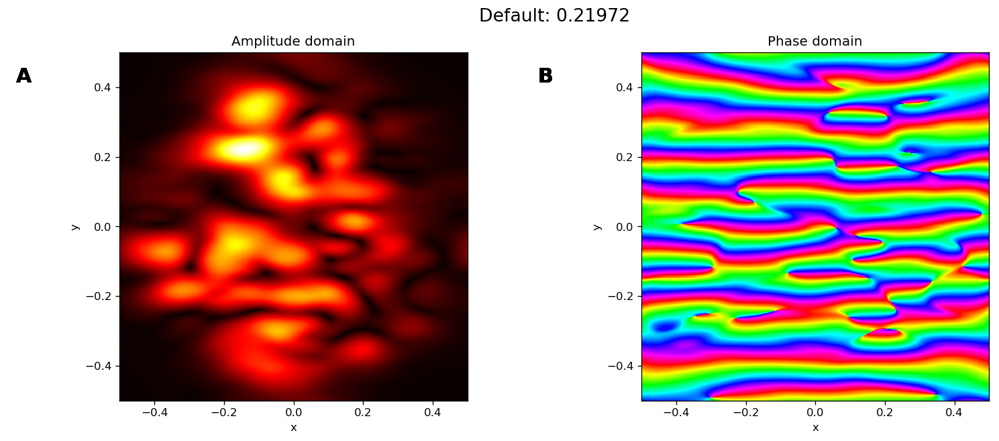
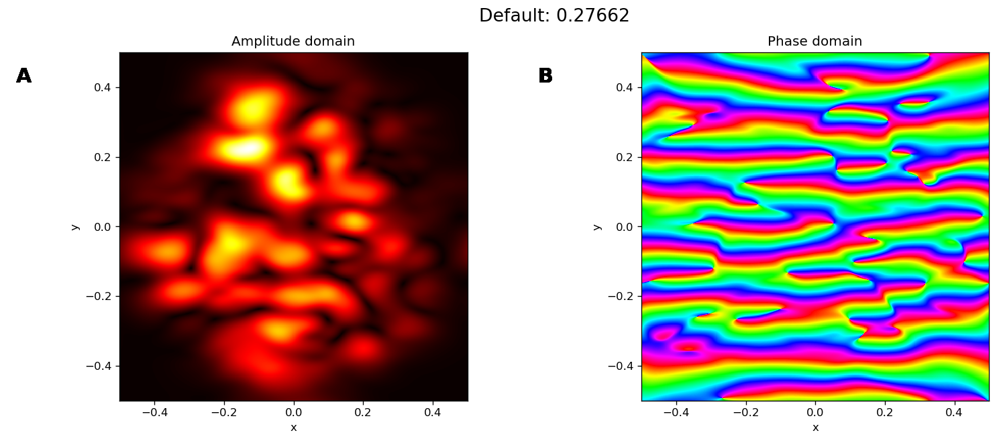

In [36]:
filter_explore(image, param_name='B_theta', param_range=lg.pe.B_theta*np.logspace(-.3, .2, 6))

:Layout
   .Amplitude_domain.I :HoloMap   [Default]
      :Image   [x,y]   (z)
   .Phase_domain.I     :HoloMap   [Default]
      :Image   [x,y]   (z)
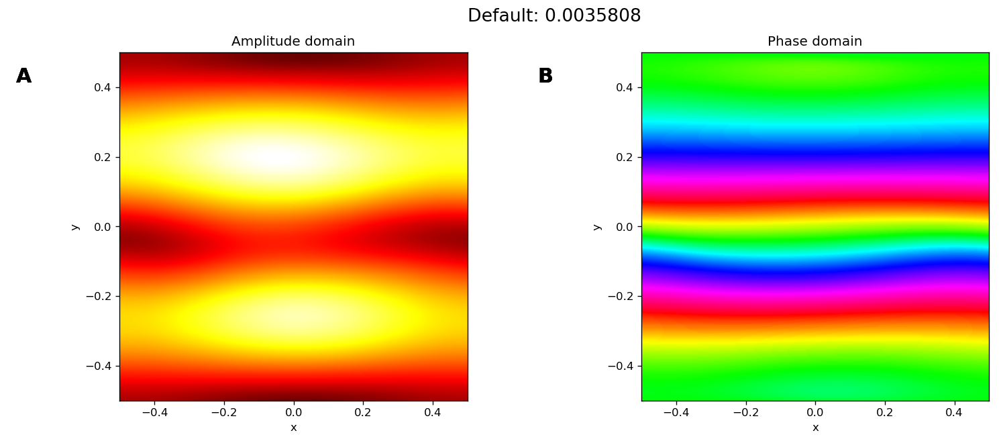
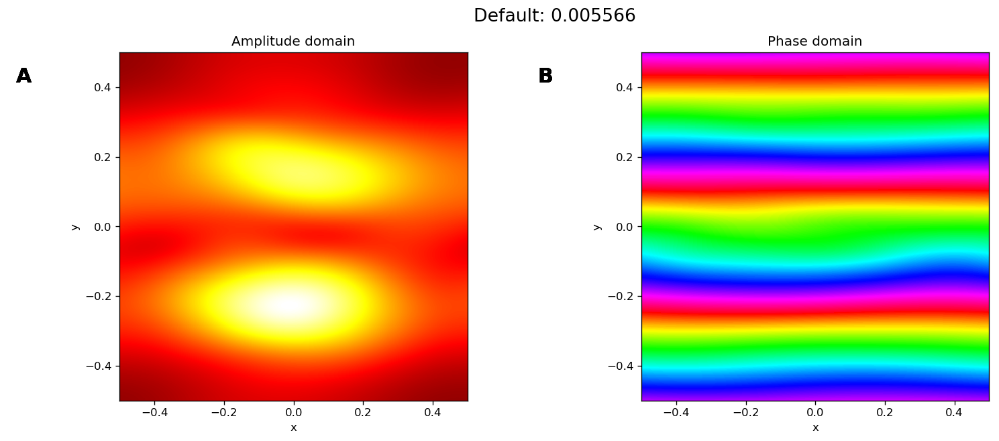
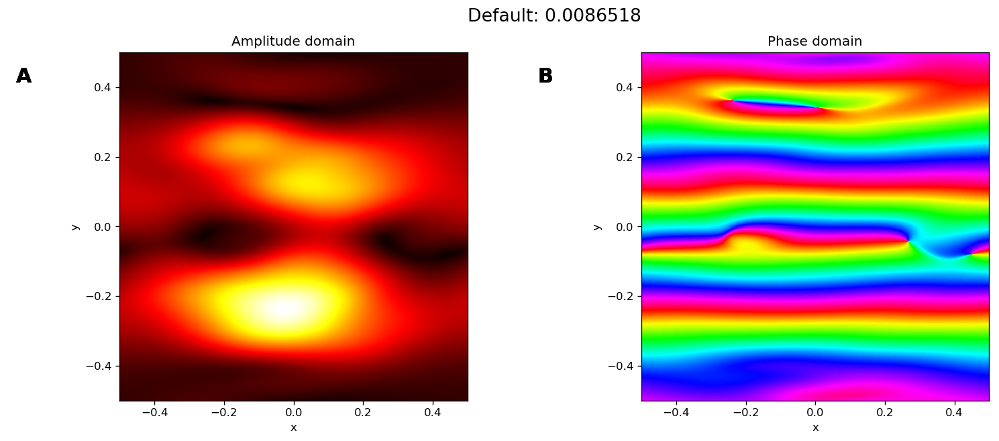
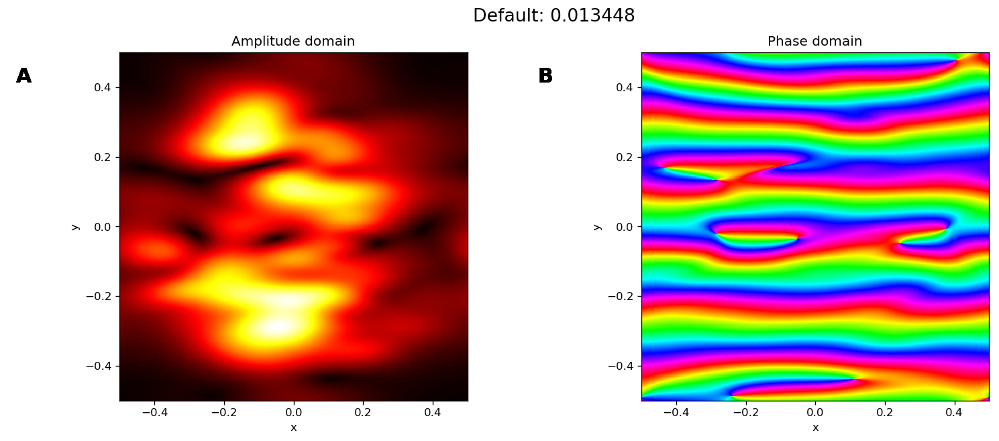
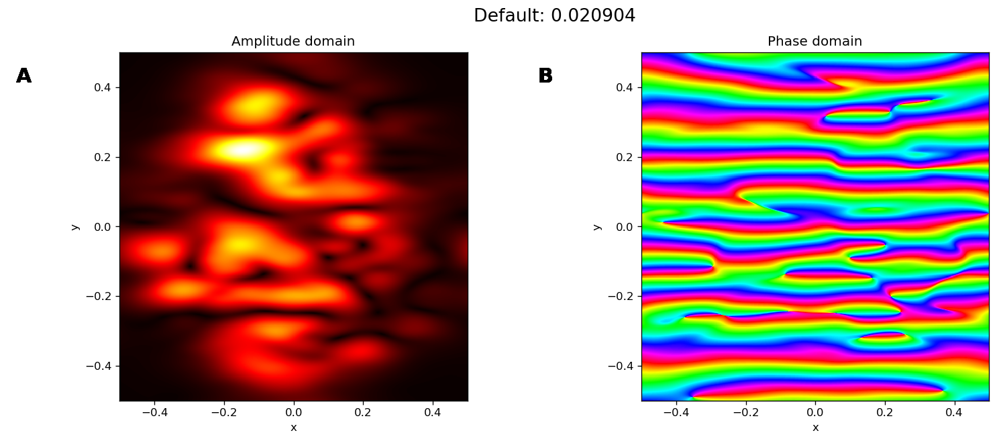
...
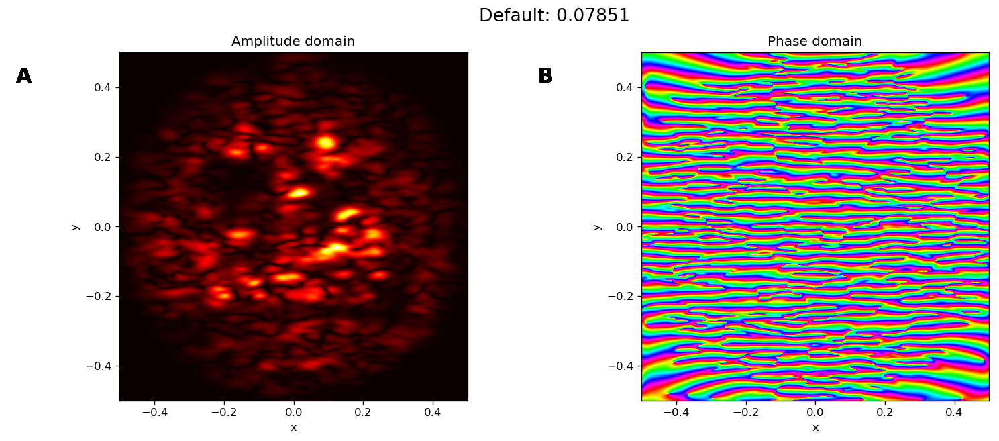
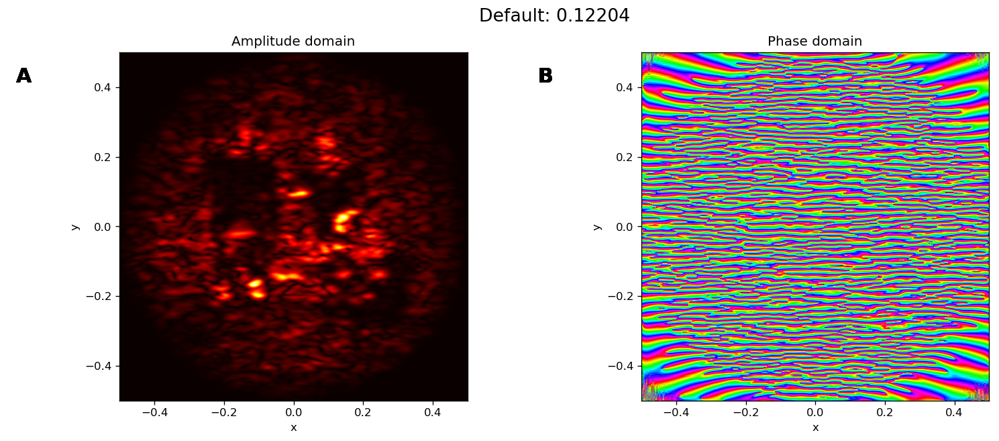
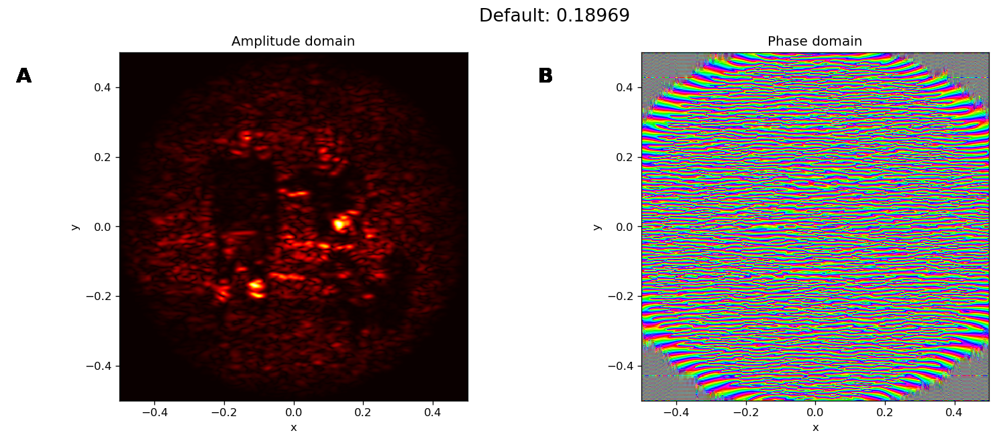
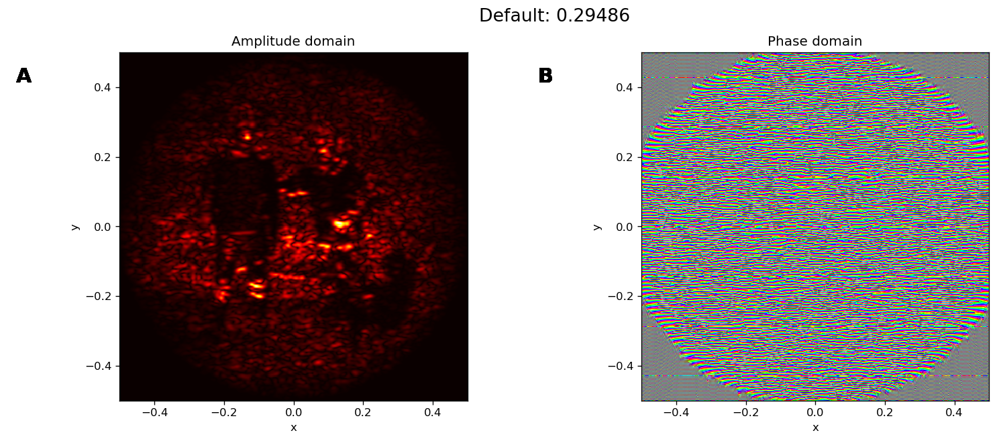
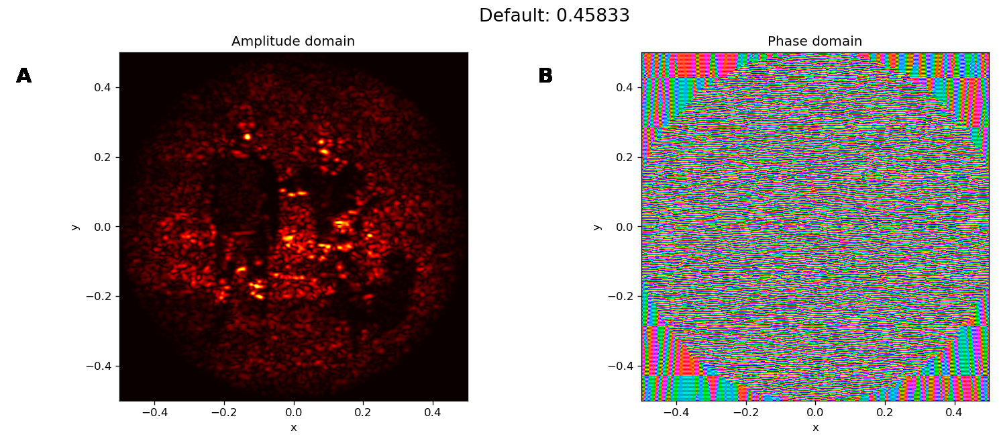

In [37]:
filter_explore(image, param_name='sf_0', param_range=lg.sf_0, verb=True)

:Layout
   .Amplitude_domain.I :HoloMap   [Default]
      :Image   [x,y]   (z)
   .Phase_domain.I     :HoloMap   [Default]
      :Image   [x,y]   (z)
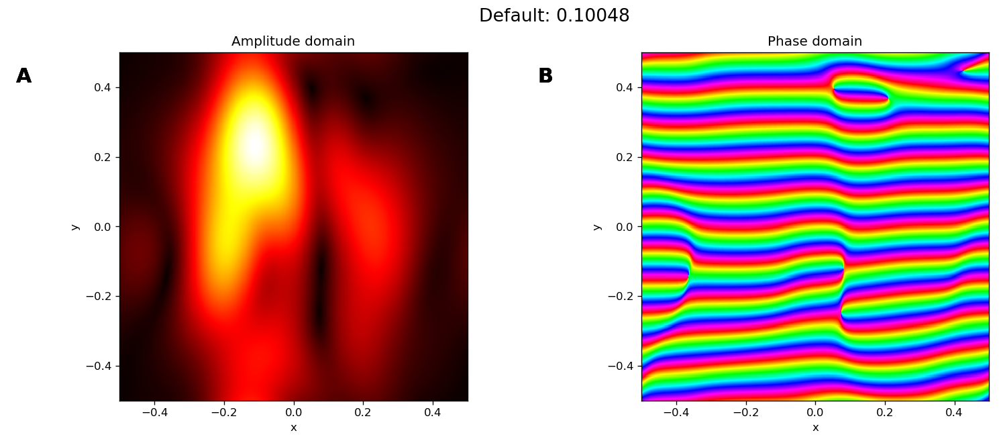
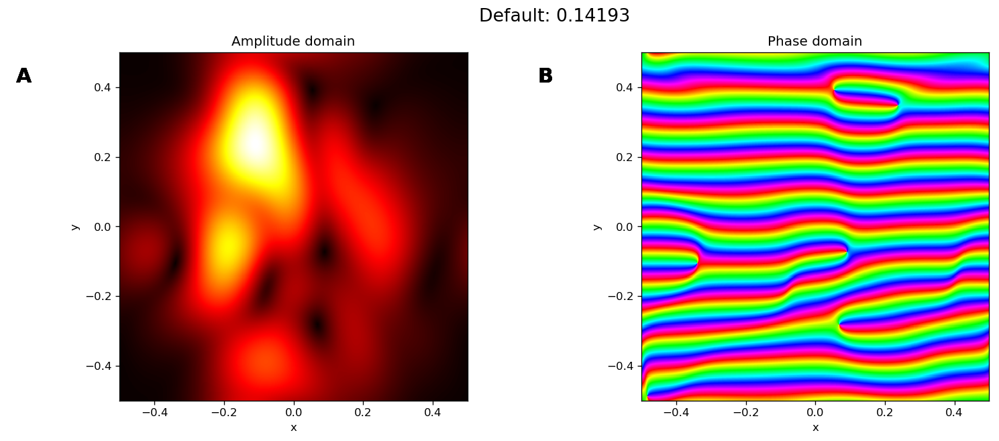
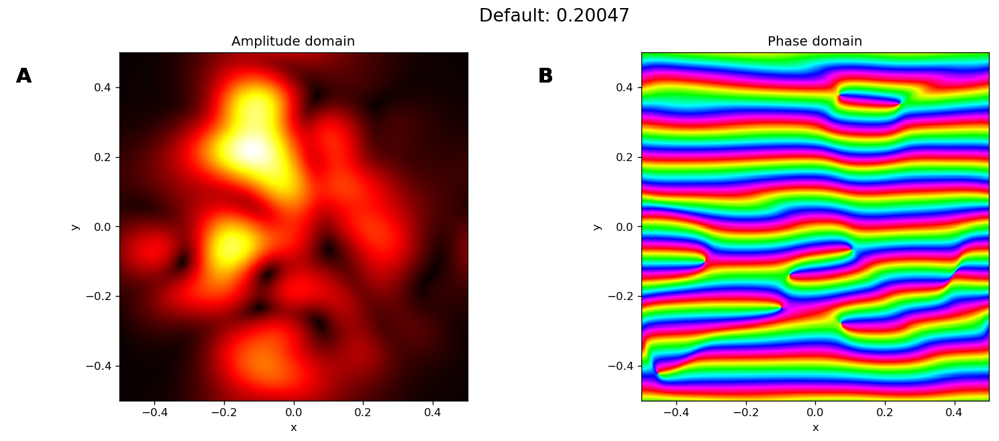
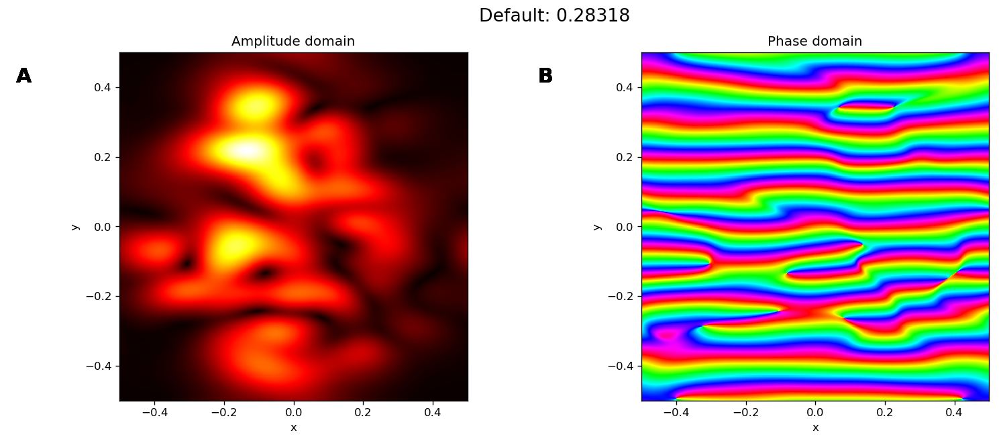
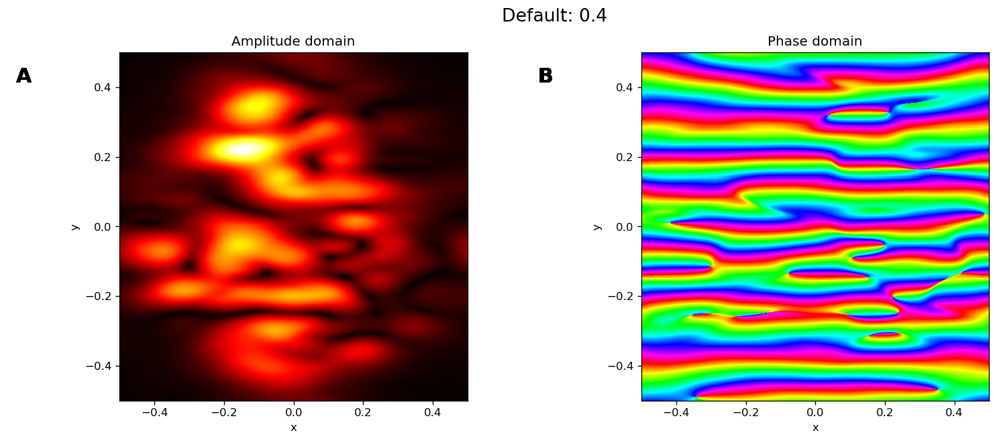
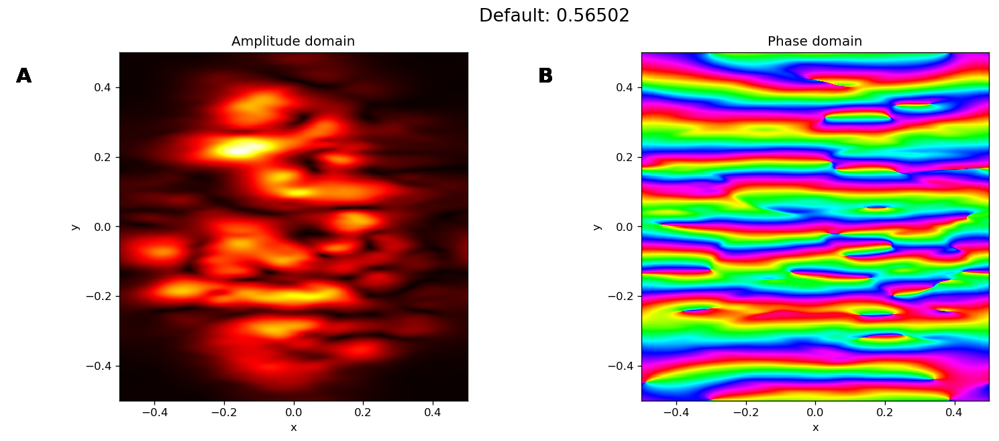
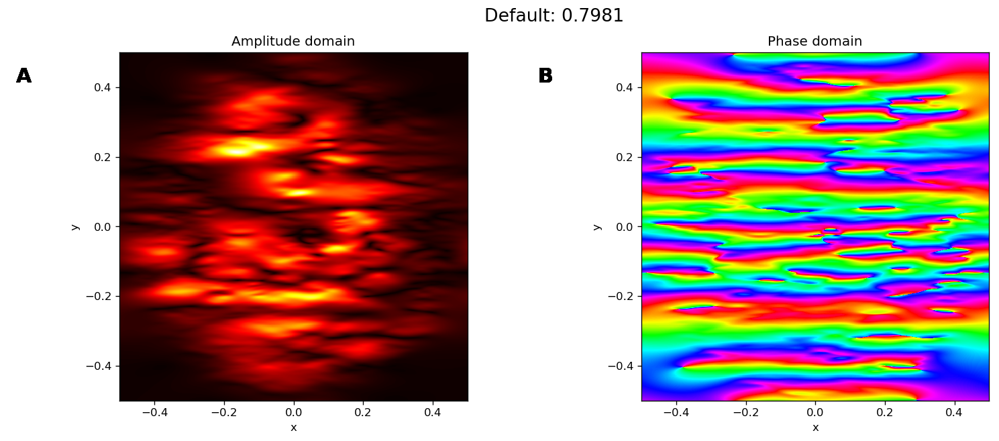
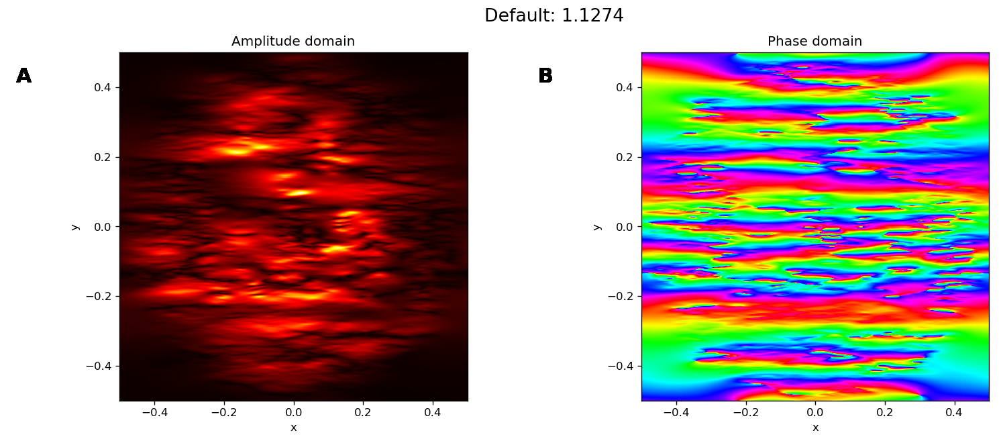
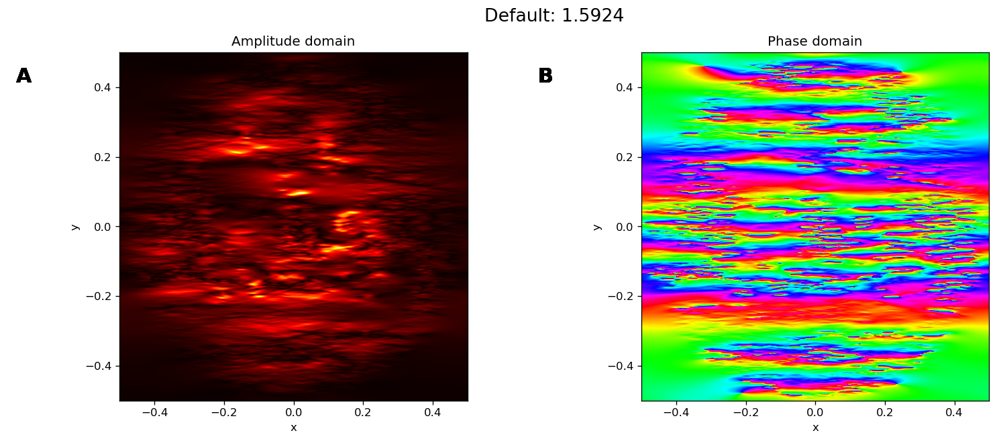

In [38]:
filter_explore(image, param_name='B_sf', param_range=lg.pe.B_sf*np.logspace(-.6, .6, 9))

In [40]:
#BOOK KEEPING
%load_ext watermark
%watermark

2019-12-04T12:48:04+01:00

CPython 3.7.0
IPython 6.5.0

compiler   : MSC v.1912 64 bit (AMD64)
system     : Windows
release    : 10
machine    : AMD64
processor  : Intel64 Family 6 Model 142 Stepping 9, GenuineIntel
CPU cores  : 4
interpreter: 64bit


In [42]:
%load_ext version_information
%version_information numpy, scipy, matplotlib, SLIP, LogGabor

Software versions
Python 3.7.0 64bit [MSC v.1912 64 bit (AMD64)]
IPython 6.5.0
OS Windows 10 10.0.18362 SP0
numpy 1.15.1
scipy 1.1.0
matplotlib 2.2.3
SLIP 20191113
LogGabor 20191113
Wed Dec 04 12:49:09 2019 Paris, Madrid